In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
import sys
import logging
from psutil import virtual_memory

In [3]:
gpu_info = !nvidia-smi
gpu_info = '\n'.join(gpu_info)
ram_gb = virtual_memory().total / 1e9

In [4]:
tf_response = {
    'error': None,
    'TF version': '',
    'COLAB': None,
    'GPU': False,
    'ram_gb': ''
}

In [5]:
try:
    # drive
    from google.colab import drive
    IN_COLAB = 'google.colab' in sys.modules

    # updating tensorflow version
    %tensorflow_version 2.x

    # tensorflow-gpu & tensorflowjs
    !pip install tensorflow-gpu # !pip install tensorflow_text # I could use BERT
    !pip install tensorflowjs

    # NLP (nltk, stanza, spacy)
    !pip install nltk 
    !pip install stanza
    !pip install spacy
    !spacy download en_core_web_sm # sm md lg
    !python -m spacy download en
except OSError as error:
    # debugging error
    response['error'] = logging.debug('You are not using your specify version of TensorFlow')
    IN_COLAB = False

    # install requirements
    !pip install -r '../requirements.txt'
finally:
    tf_response['COLAB'] = IN_COLAB
    
    # Importing tensroflow core
    import tensorflow as tf
    import tensorflowjs as tfjs
    from tensorflow import keras
    from keras.utils import to_categorical
    from sklearn import preprocessing

    from tensorflow.keras.preprocessing.text import Tokenizer
    from tensorflow.keras.preprocessing.sequence import pad_sequences
    from keras.callbacks import EarlyStopping
    from keras.callbacks import ModelCheckpoint

    from tensorflow.keras.models import Sequential
    from tensorflow.keras.layers import Dense, Flatten, LSTM, Dropout, Activation, Embedding, Bidirectional, GlobalMaxPool1D

    from sklearn.model_selection import train_test_split
    
    # GPU and RAM response
    if tf.config.list_physical_devices('GPU'):
        GPU = True
        tf_response['GPU'] = GPU
        tf_response['TF_version'] = tf.__version__
        
        if tf_response['COLAB'] == True:
            if gpu_info.find('failed') >= 0:
                print('Select the Runtime > "Change runtime type" menu to enable a GPU accelerator')
                print('Re-execute this cell.')
            else:
                print(gpu_info)
            
            if ram_gb < 20:
                print('To enable a high-RAM runtime, select the Runtime > "Change runtime type menu"')
                print('Select high-RAM in the runtime shape dropdown')
                print('Re-execute this cell')
                tf_response['ram_gb'] = 'low-RAM runtime'
            else:
                tf_response['ram_gb'] = 'high-RAM runtime'
            print('\nRuntime {:.2f} GB of available RAM\n'.format(ram_gb))

     |████████████████████████████████| 320.4MB 26kB/s 
     |████████████████████████████████| 61kB 1.9MB/s 
     |████████████████████████████████| 137.3MB 79kB/s 
     |████████████████████████████████| 92kB 5.2MB/s 
     |████████████████████████████████| 256kB 41.4MB/s 
  Created wheel for PyInquirer: filename=PyInquirer-1.0.3-cp36-none-any.whl size=32852 sha256=885428950b0c3801aa30542f8e78e06864e31254e4f8c76b4785bc1dba5d240e
  Stored in directory: /root/.cache/pip/wheels/52/6c/b1/3e4b0e8daf42a92883c7641c0ea8ffb62e0490ebed2faa55ad
Successfully built PyInquirer
  Found existing installation: tensorflow-hub 0.9.0
    Uninstalling tensorflow-hub-0.9.0:
      Successfully uninstalled tensorflow-hub-0.9.0
  Found existing installation: prompt-toolkit 1.0.18
    Uninstalling prompt-toolkit-1.0.18:
      Successfully uninstalled prompt-toolkit-1.0.18


     |████████████████████████████████| 235kB 2.9MB/s 
✔ Download and installation successful
You can now load the model via spacy.load('en_core_web_sm')
✔ Download and installation successful
You can now load the model via spacy.load('en_core_web_sm')
✔ Linking successful
/usr/local/lib/python3.6/dist-packages/en_core_web_sm -->
/usr/local/lib/python3.6/dist-packages/spacy/data/en
You can now load the model via spacy.load('en')


In [6]:
tf_response

{'COLAB': True, 'GPU': False, 'TF version': '', 'error': None, 'ram_gb': ''}

In [7]:
# Data analysis
from keras.layers.merge import Concatenate
from collections import Counter
import matplotlib.pyplot as plt
from keras.layers import Input
from keras.models import Model
from numpy import array
from numpy import asarray
from numpy import zeros
from string import punctuation
from keras.utils import plot_model
import pandas as pd
import numpy as np
import sys
import re

%matplotlib inline

# Image
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator # to create a Word Cloud
from PIL import Image # Pillow with WordCloud to image manipulation

In [8]:
# nltk
import nltk
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer

nltk.download('stopwords')
nltk.download('wordnet')

STOPWORDS = set(stopwords.words('english'))

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.
[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Unzipping corpora/wordnet.zip.


In [9]:
# Spacy NLP
import spacy
spNLP = spacy.load('en_core_web_sm')
spNLP.max_length = 103950039 # or higher
# spacy.prefer_gpu() #will not work with stanza

In [10]:
def nltk_lemma(text):
    lemmatizer = WordNetLemmatizer()
    lemmatizer.lemmatize(text)

In [11]:
df_mbti = pd.read_csv("/content/drive/My Drive/LinkedIn/mbti_1.csv",encoding='utf-8')

In [12]:
def remove_URL(sample):
    """Remove URLs from a sample string"""
    return re.sub(r"http\S+", "", sample)

In [13]:
df_mbti["cleanposts"] = df_mbti["posts"].apply(remove_URL)

In [14]:
def clean_data(text,clean_stopwords=True,clean_puntuation=True,clean_numbers=True):
    text = text.lower()
    text = text.strip() #Leading and trailing whitespaces are removed
    text = text.strip("'") 
    text = text.strip()
    pattern = pattern = r"\|\|\|"
    f = lambda x : re.sub(pattern , " " , x)
    text = f(text)
    #Clean web links
    pattern = r"(https?:\/\/)(\s)*(www\.)?(\s)*((\w|\s)+\.)*([\w\-\s]+\/)*([\w\-]+)((\?)?[\w\s]*=\s*[\w\%&]*)*"
    f = lambda x: re.sub(pattern , "" , x)
    text = f(text)

    if clean_stopwords == True:
        #Clean Stopwords
        stopword = r"|".join([f"\s{word}\s" for word in stopwords.words("english")])
        f = lambda x : re.sub(stopword, " " , x)
        text = f(text)
    if clean_puntuation == True:
        #Clean punctuations
        #Let's not remove apostrohspe "'' so our text can make more sense
        punctuations = punctuation.replace("'" , "")
        punctuations = f"[{punctuations}]"
        f = lambda x : re.sub(punctuations , "" , text)
        text = f(text)
    if clean_numbers == True:
        #Clean Numbers
        f = lambda x : re.sub(r"[0-9]+" , "" , x)
        text = f(text)
    
    # Join the characters again to form the string.
    text = ' '.join(text.split())
    return text

In [15]:
df_mbti["cleanposts"] = df_mbti["cleanposts"].apply(clean_data)

In [16]:
def remove_whitespace(x):
    """
    Helper function to remove any blank space from a string
    x: a string
    """
    try:
        # Remove spaces inside of the string
        x = " ".join(x.split())

    except:
        pass
    return x

In [17]:
df_mbti["cleanposts"] = df_mbti["cleanposts"].apply(remove_whitespace)

In [18]:
df_mbti["len"] = df_mbti["cleanposts"].apply(len)

In [19]:
df_mbti.head()

,type,posts,cleanposts,len
0,INFJ,'http://www.youtube.com/watch?v=qsXHcwe3krw|||...,and intj moments sportscenter top ten plays pr...,2425
1,ENTP,'I'm finding the lack of me in these posts ver...,i'm finding lack me these posts alarming sex b...,4559
2,INTP,'Good one _____ https://www.youtube.com/wat...,good one course which say know that's blessing...,3566
3,INTJ,"'Dear INTP, I enjoyed our conversation the o...",dear intp enjoyed conversation other day esote...,4382
4,ENTJ,'You're fired.|||That's another silly misconce...,you're fired that's another silly misconceptio...,4083


In [20]:
indexNames = df_mbti[df_mbti["len"] == 0 ].index #do this 
indexNames

df_mbti.drop(indexNames , inplace=True) #do this

In [21]:
y = df_mbti['type']
X  = df_mbti['cleanposts']

In [22]:
maxlen = df_mbti.len.max()

In [23]:
maxlen

7509

In [24]:
from sklearn import preprocessing
label_encoder = preprocessing.LabelEncoder()

In [25]:
y = label_encoder.fit_transform(y)

In [26]:
y

array([ 8,  3, 11, ..., 11,  9,  9])

In [27]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.20, random_state=42)

In [28]:
y_train.shape,X_train.shape

((6939,), (6939,))

In [29]:
y_train = to_categorical(y_train)
y_test = to_categorical(y_test)

In [30]:
y_train

array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 1., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.]], dtype=float32)

In [31]:
tokenizer = Tokenizer(num_words=5000)

In [32]:
tokenizer.fit_on_texts(X_train)

In [33]:
X_train = tokenizer.texts_to_sequences(X_train)

In [34]:
X_test = tokenizer.texts_to_sequences(X_test)

In [35]:
X_test

[[2,
  27,
  65,
  457,
  175,
  383,
  8,
  1990,
  37,
  94,
  441,
  279,
  45,
  733,
  4659,
  1481,
  28,
  323,
  3,
  750,
  2,
  438,
  78,
  69,
  415,
  8,
  178,
  9,
  191,
  74,
  52,
  11,
  1729,
  25,
  1001,
  25,
  269,
  1424,
  12,
  32,
  25,
  3267,
  25,
  44,
  126,
  43,
  72,
  44,
  100,
  44,
  168,
  204,
  334,
  2,
  110,
  1059,
  2278,
  99,
  2639,
  3236,
  120,
  1,
  78,
  25,
  6,
  12,
  1616,
  15,
  6,
  325,
  495,
  719,
  4334,
  63,
  2,
  162,
  23,
  180,
  65,
  4334,
  178,
  36,
  27,
  9,
  35,
  118,
  32,
  94,
  446,
  45,
  12,
  156,
  2,
  228,
  11,
  21,
  3428,
  1,
  2851,
  386,
  1088,
  21,
  1570,
  2129,
  2414,
  99,
  3,
  1247,
  930,
  8,
  321,
  719,
  1,
  2414,
  571,
  1247,
  4655,
  426,
  98,
  480,
  11,
  44,
  81,
  96,
  858,
  44,
  1254,
  20,
  60,
  44,
  221,
  1838,
  272,
  128,
  68,
  147,
  561,
  274,
  213,
  144,
  44,
  144,
  822,
  126,
  81,
  1343,
  40,
  783,
  153,
  12,
  35,
  135,

In [36]:
vocab_size = len(tokenizer.word_index) + 1

X_train = pad_sequences(X_train, padding='post', maxlen=maxlen)
X_test = pad_sequences(X_test, padding='post', maxlen=maxlen)

## **Global Variable**

In [37]:
def preprocessing(X, y, maxlen):
  
  from sklearn import preprocessing
  # The X variable contains the feature set, where as the y variable contains label set.

  # label_encoder object knows how to understand word labels.
  label_encoder = preprocessing.LabelEncoder()

  # Encode labels in column 'category'.
  y = label_encoder.fit_transform(y)

  #splitting the dataset into train and test
  X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.20, random_state=42)

  #convert to categorical variable
  y_train = to_categorical(y_train)
  y_test = to_categorical(y_test)
  
  tokenizer = Tokenizer()
  tokenizer.fit_on_texts(X_train)

  X1_train = tokenizer.texts_to_sequences(X_train)
  X1_test = tokenizer.texts_to_sequences(X_test)

  vocab_size = len(tokenizer.word_index) + 1

  X1_train = pad_sequences(X1_train, padding='post', maxlen=maxlen)
  X1_test = pad_sequences(X1_test, padding='post', maxlen=maxlen)


  return X1_train,y_train,y_test, X1_test,maxlen,vocab_size,tokenizer

In [189]:
!ls '/content/drive/My Drive/LinkedIn/Outbound/glove.6B.100d.txt'

Ajit_new  glove.6B.100d.txt


GloVe word embeddings for creating word vectors

In [38]:
def GloVe(vocab_size,tokenizer):

  embeddings_dictionary = dict()

  glove_file = open('/content/drive/My Drive/LinkedIn/Outbound/glove.6B.100d.txt', encoding="utf8")

  for line in glove_file:
      records = line.split()
      word = records[0]
      vector_dimensions = asarray(records[1:], dtype='float32')
      embeddings_dictionary[word] = vector_dimensions

  glove_file.close()

  embedding_matrix = zeros((vocab_size, 100))
  for word, index in tokenizer.word_index.items():
      embedding_vector = embeddings_dictionary.get(word)
      if embedding_vector is not None:
          embedding_matrix[index] = embedding_vector
  
  return embedding_matrix

In [39]:
embedding_matrix = GloVe(vocab_size,tokenizer)

In [40]:
(vocab_size)

134460

In [41]:
deep_inputs = Input(shape=(maxlen,))
embedding_layer = Embedding(vocab_size, 100, weights=[embedding_matrix], trainable=False)(deep_inputs)
LSTM_Layer_1 = LSTM(128)(embedding_layer)
dense_layer_1 = Dense(16, activation='softmax')(LSTM_Layer_1)
model = Model(inputs=deep_inputs, outputs=dense_layer_1)

model.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['acc'])

In [42]:
deep_inputs

<tf.Tensor 'input_1:0' shape=(None, 7509) dtype=float32>

In [43]:
print(model.summary())

Model: "functional_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, 7509)]            0         
_________________________________________________________________
embedding (Embedding)        (None, 7509, 100)         13446000  
_________________________________________________________________
lstm (LSTM)                  (None, 128)               117248    
_________________________________________________________________
dense (Dense)                (None, 16)                2064      
Total params: 13,565,312
Trainable params: 119,312
Non-trainable params: 13,446,000
_________________________________________________________________
None


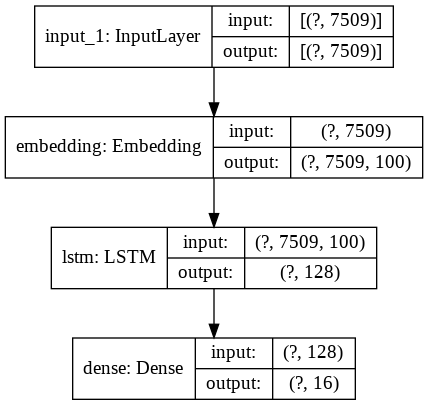

In [44]:
from keras.utils import plot_model
plot_model(model, to_file='model_plot1.png', show_shapes=True, show_layer_names=True)

In [45]:
X_train.shape,y_train.shape

((6939, 7509), (6939, 16))

In [ ]:
history = model.fit(X_train,y_train, batch_size=16, epochs=10, verbose=1, validation_split=0.2)

Epoch 1/10
112/347 [========>.....................] - ETA: 22:30 - loss: 2.3638 - acc: 0.1763

In [ ]:
def build_model(embedding_matrix,maxlen,vocab_size):

  deep_inputs = Input(shape=(maxlen,))
  embedding_layer = Embedding(vocab_size, 100, weights=[embedding_matrix], trainable=False)(deep_inputs)
  LSTM_Layer_1 = LSTM(128)(embedding_layer)
  dense_layer_1 = Dense(64, activation='relu')(LSTM_Layer_1)
  dense_layer_2 = Dense(10, activation='softmax')(dense_layer_1)
  model = Model(inputs=deep_inputs, outputs=dense_layer_2)

  model.compile(loss='categorical_crossentropy', optimizer=tf.keras.optimizers.Adam(learning_rate=1e-4), metrics=['acc'])

  return model

# Train model

In [ ]:
def train(model,X1_train,X2_train,y_train,batch_size,epochs):

  # es = tf.keras.callbacks.EarlyStopping(monitor='val_loss', mode = 'min', patience=8)
  # mc = tf.keras.callbacks.ModelCheckpoint('tfjsmodel.h5', monitor='val_acc',mode = 'max', verbose=1, save_best_only=True)

  history = model.fit(x=[X1_train, X2_train], y=y_train, batch_size=batch_size, callbacks = [mc, es],epochs=epochs, verbose=1, validation_split=0.2)

  return history

### **Plotting history**

In [ ]:
def plot_history_(history,score):

  print("Test Score:", score[0])
  print("Test Accuracy:", score[1])

  plt.plot(history.history['acc'])
  plt.plot(history.history['val_acc'])

  plt.title('model accuracy')
  plt.ylabel('accuracy')
  plt.xlabel('epoch')
  plt.legend(['train','test'], loc='upper left')
  plt.show()
  plt.savefig('Accuracy.png')

  plt.plot(history.history['loss'])
  plt.plot(history.history['val_loss'])

  plt.title('model loss')
  plt.ylabel('loss')
  plt.xlabel('epoch')
  plt.legend(['train','test'], loc='upper left')
  plt.show()
  plt.savefig('Loss.png')

## **Main**

In [ ]:
def main(maxlen,epochs,batch_size):

  X, y = load_clean_dataset() #load and clean dataset

  X1_train,y_train,y_test, X1_test,X2_train,X2_test,maxlen,vocab_size,tokenizer = preprocessing(X, y, maxlen) #preprocess dataset

  print(X1_test.shape, X2_test.shape)
  embedding_matrix = GloVe(vocab_size,tokenizer) #glove

  model = build_model(embedding_matrix,maxlen,vocab_size) #building model

  plot_model(model, to_file='model_plot3.png', show_shapes=True, show_layer_names=True)

  history = train(model,X1_train,X2_train,y_train,batch_size,epochs)
    
  score = model.evaluate(x=[X1_test, X2_test], y=y_test, verbose=1)
  
  plot_history_(history,score)

## **name == "main"**

--2020-09-21 16:57:49--  https://raw.githubusercontent.com/Y4rd13/sentiment-analysis/master/datasets/results/categories_dataset.csv
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 151.101.0.133, 151.101.64.133, 151.101.128.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|151.101.0.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 7127163 (6.8M) [text/plain]
Saving to: ‘datasets/categories_dataset.csv’

categories_dataset. 100%[===================>]   6.80M  19.6MB/s    in 0.3s    

2020-09-21 16:57:50 (19.6 MB/s) - ‘datasets/categories_dataset.csv’ saved [7127163/7127163]



/usr/local/lib/python3.6/dist-packages/IPython/core/interactiveshell.py:2882: DtypeWarning: Columns (3) have mixed types.Specify dtype option on import or set low_memory=False.
  exec(code_obj, self.user_global_ns, self.user_ns)
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  # This is added back by InteractiveShellApp.init_path()


(17962, 30) (17962, 3)
Model: "functional_1"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 30)]         0                                            
__________________________________________________________________________________________________
input_2 (InputLayer)            [(None, 3)]          0                                            
__________________________________________________________________________________________________
embedding (Embedding)           (None, 30, 100)      1967200     input_1[0][0]                    
__________________________________________________________________________________________________
dense (Dense)                   (None, 10)           40          input_2[0][0]                    
________________________________________________________________

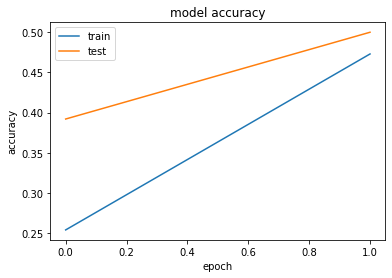

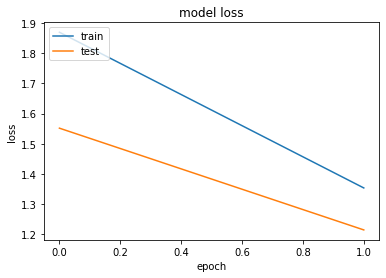

<Figure size 432x288 with 0 Axes>

In [ ]:
if __name__ == "__main__":
   main(maxlen,epochs,batch_size)